In [1]:
#formato de imágenes

In [1]:
import pandas as pd
import numpy as np
import re
import plotly.express as px
import ast
import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from scipy import stats
import scikit_posthocs as sp
from pymoo.visualization.scatter import Scatter
from pymoo.visualization.pcp import PCP

In [2]:
dim='10'

In [3]:
#función para leer como arreglo la columna
def arreglos(cadena):
    cadena = ','.join(cadena.replace('[ ', '[').split())
    return np.array(ast.literal_eval(cadena))

In [4]:
def medianas_indicadores(data,indicador):
    ranks=data[[ indicador,'Algoritmo', 'Problema']].rank(pct=True)
    close_to_median = abs(ranks - 0.5)
    medianas=close_to_median.idxmin()
    return data.loc[medianas[0]]['Ejecucion']

In [5]:
#función para obtener el registro en el que se encuentra la mediana
def fila_mediana(data,algoritmo,problema):
    #seleccionamos los datos que queremos
    ranks=data[(data['Problema']==problema)&(data['Algoritmo']==algoritmo)].drop(['Epoca','Fe','Ejecucion','X','F'],axis=1).rank(pct=True)
    #buscamos el índice de la mediana
    close_to_median = abs(ranks - 0.5)
    medianas=close_to_median.idxmin()
    return medianas[0:3]

## Lectura y limpieza de datos

In [6]:
imagenes="img/"

In [7]:
df=pd.read_csv('resultados'+str(dim)+'_dim.csv')
df.shape

(46002, 11)

In [8]:
#Eliminamos los registros que tienen el nombre de las columnas
df=df.drop(df[df['Epoca']=='Epoca'].index)
df.shape

(46000, 11)

In [9]:
df.tail()

,Epoca,Fe,gdp,delta_p,igdp,Tiempo,X,F,Ejecucion,Algoritmo,Problema
45995,496,99200,0.12119788080310123,65.46919635641147,0.30915266361736204,246.39211058616638,[[ 1.94885378 3.98785818 4.94286056 ... 15.6...,[[0.0760094 0.06974184 0.04175576 ... 0.07799...,12,NSGA3,wfg2
45996,497,99400,0.12121926219981419,65.46938675315783,0.3094481544784375,246.90151357650757,[[ 1.99991581 3.99637304 3.06208343 ... 15.7...,[[0.27034426 0.0246139 0.03203377 ... 0.05841...,12,NSGA3,wfg2
45997,498,99600,0.12116570613929042,65.47833784563308,0.3094965942654086,247.4120008945465,[[ 1.99987524 3.98693607 5.8668221 ... 15.7...,[[0.70739124 0.02100673 0.02963952 ... 0.01325...,12,NSGA3,wfg2
45998,499,99800,0.12119535226465826,65.48056067763574,0.309581239468777,247.92081785202026,[[ 1.99965473 3.98909349 5.98895467 ... 15.7...,[[0.00752692 0.00758529 0.00770539 ... 0.02056...,12,NSGA3,wfg2
45999,500,100000,0.12074633498233764,65.48207411839637,0.3094327676938975,248.43076753616333,[[ 1.99961108 3.9958023 5.8235021 ... 15.6...,[[3.16087796e-02 8.60214945e-01 5.20016060e-02...,12,NSGA3,wfg2


In [10]:
#guardamos datos limpios
df.to_csv('resultadostemp.csv',index=False)

In [11]:
df=pd.read_csv('resultadostemp.csv')
df.shape

(46000, 11)

In [12]:
'''#usamos funcion para leer datos como arreglos en lugar de como cadenas
df = pd.read_csv('resultados.csv')#, converters={'F': arreglos})#'X': arreglos,
np.shape(df)'''

"#usamos funcion para leer datos como arreglos en lugar de como cadenas\ndf = pd.read_csv('resultados.csv')#, converters={'F': arreglos})#'X': arreglos,\nnp.shape(df)"

In [13]:
df.head()

,Epoca,Fe,gdp,delta_p,igdp,Tiempo,X,F,Ejecucion,Algoritmo,Problema
0,1,200,2.934883,222.293738,3.178886,0.287637,[[1.33701757e+00 1.43082505e+00 4.19015482e+00...,[[2.43794086 0.95122317 0.95333985 0.94963816 ...,1,NSGA2,wfg1
1,2,400,2.907635,221.440630,3.176861,0.510957,[[ 1.33701757 1.43082505 4.19015482 ... 15.4...,[[2.43794086 0.95122317 0.95333985 0.94963816 ...,1,NSGA2,wfg1
2,3,600,2.867781,219.442396,3.145065,0.661117,[[1.33701757e+00 1.43082505e+00 4.19015482e+00...,[[2.43794086 0.95122317 0.95333985 0.94963816 ...,1,NSGA2,wfg1
3,4,800,2.866074,215.391902,3.119030,0.909812,[[1.33701757e+00 1.43082505e+00 4.19015482e+00...,[[2.43794086 0.95122317 0.95333985 0.94963816 ...,1,NSGA2,wfg1
4,5,1000,2.855592,211.547152,3.020198,1.181764,[[ 1.33701757 1.43082505 4.19015482 ... 15.4...,[[2.43794086 0.95122317 0.95333985 0.94963816 ...,1,NSGA2,wfg1


In [14]:
#resultados de cada ejecución
finales=df[df['Fe']==100000].copy()
finales['F']=finales['F'].apply(arreglos)
finales.head()

/tmp/ipykernel_10248/1775109332.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(ast.literal_eval(cadena))


,Epoca,Fe,gdp,delta_p,igdp,Tiempo,X,F,Ejecucion,Algoritmo,Problema
499,500,100000,2.476709,168.607320,2.537107,237.642335,[[3.94726348e-06 1.14002064e-10 2.93832024e+00...,"[[1.36485146, 0.8265459, 0.8269949, Ellipsis, ...",1,NSGA2,wfg1
999,500,100000,2.454554,168.180917,2.507740,237.374768,[[1.60162065e+00 3.76811566e+00 4.05227793e+00...,"[[2.36276643, 0.72423656, 0.72558935, Ellipsis...",2,NSGA2,wfg1
1499,500,100000,2.372900,158.643685,2.333435,236.623479,[[1.07036065e+00 3.71422434e+00 2.17967863e+00...,"[[1.30069284, 0.73772904, 0.77073288, Ellipsis...",3,NSGA2,wfg1
1999,500,100000,2.348777,159.865788,2.362127,232.862545,[[1.12370362e-01 2.54124325e-12 4.58873947e+00...,"[[1.28632662, 0.85530913, 0.86706777, Ellipsis...",4,NSGA2,wfg1
2499,500,100000,2.424446,159.165602,2.320219,233.351590,[[5.39835841e-02 1.72502998e+00 3.87166977e-01...,"[[1.58652866, 0.71715442, 0.7917776, Ellipsis,...",5,NSGA2,wfg1


## Análisis general

In [15]:
#observamos que no hay valores faltantes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46000 entries, 0 to 45999
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Epoca      46000 non-null  int64  
 1   Fe         46000 non-null  int64  
 2   gdp        46000 non-null  float64
 3   delta_p    46000 non-null  float64
 4   igdp       46000 non-null  float64
 5   Tiempo     46000 non-null  float64
 6   X          46000 non-null  object 
 7   F          46000 non-null  object 
 8   Ejecucion  46000 non-null  int64  
 9   Algoritmo  46000 non-null  object 
 10  Problema   46000 non-null  object 
dtypes: float64(4), int64(3), object(4)
memory usage: 3.9+ MB


In [16]:
#estadísticos descriptivos de todos los datos
df.drop(['Epoca','Ejecucion','Fe'],axis=1).describe()

,gdp,delta_p,igdp,Tiempo
count,46000.000000,46000.000000,46000.000000,46000.000000
mean,1.599628,138.445279,1.679117,122.658262
std,0.812419,47.882540,0.957435,96.264041
min,0.094242,57.233471,0.182273,0.026044
25%,1.060170,94.487123,0.732903,43.167079
50%,1.785036,160.172161,2.136340,101.382149
75%,2.259813,175.494658,2.449611,186.810237
max,2.944217,623.709846,9.707896,417.588794


In [17]:
#estadísticos descriptiovos de resultados
finales.drop(['Epoca','Ejecucion','Fe'],axis=1).describe()

,gdp,delta_p,igdp,Tiempo
count,92.000000,92.000000,92.000000,92.000000
mean,1.375293,124.672064,1.401543,252.841914
std,0.848375,42.357162,0.901971,102.334090
min,0.094760,61.800020,0.220041,102.705156
25%,0.544260,89.509355,0.645317,233.412956
50%,1.500550,101.326229,0.907280,243.334463
75%,2.087965,165.020825,2.311301,258.423752
max,2.490298,223.883090,3.269932,417.588794


In [18]:
#guardamos en listas el nombre de los algoritmos, problemas e indicadores con los que contamos
algoritmos=df.Algoritmo.unique()
problemas=df.Problema.unique()
indicadores=['gdp','delta_p','igdp','Tiempo']
#problemas=['wfg1','wfg2','wfg3','wfg4','wfg5']

## Análisis por algoritmo y problema

In [21]:
df.tail()

,Epoca,Fe,gdp,delta_p,igdp,Tiempo,X,F,Ejecucion,Algoritmo,Problema
45995,496,99200,0.121198,65.469196,0.309153,246.392111,[[ 1.94885378 3.98785818 4.94286056 ... 15.6...,[[0.0760094 0.06974184 0.04175576 ... 0.07799...,12,NSGA3,wfg2
45996,497,99400,0.121219,65.469387,0.309448,246.901514,[[ 1.99991581 3.99637304 3.06208343 ... 15.7...,[[0.27034426 0.0246139 0.03203377 ... 0.05841...,12,NSGA3,wfg2
45997,498,99600,0.121166,65.478338,0.309497,247.412001,[[ 1.99987524 3.98693607 5.8668221 ... 15.7...,[[0.70739124 0.02100673 0.02963952 ... 0.01325...,12,NSGA3,wfg2
45998,499,99800,0.121195,65.480561,0.309581,247.920818,[[ 1.99965473 3.98909349 5.98895467 ... 15.7...,[[0.00752692 0.00758529 0.00770539 ... 0.02056...,12,NSGA3,wfg2
45999,500,100000,0.120746,65.482074,0.309433,248.430768,[[ 1.99961108 3.9958023 5.8235021 ... 15.6...,[[3.16087796e-02 8.60214945e-01 5.20016060e-02...,12,NSGA3,wfg2


In [19]:
#cantidad de registros por algoritmo usado por problema
df.groupby(['Problema','Algoritmo']).size()

Problema  Algoritmo
wfg1      MOEAD        10000
          NSGA2        10000
          NSGA3        10000
wfg2      NSGA2        10000
          NSGA3         6000
dtype: int64

In [16]:
#media de indicador por algoritmo usado por problema
df.drop(['Epoca','Fe','Ejecucion'],axis=1).groupby(['Problema','Algoritmo']).mean()

gdp     delta_p      igdp      Tiempo
Problema Algoritmo                                            
wfg1     MOEAD      1.565094  130.938467  1.737394  167.973748
         NSGA2      1.763624  138.569777  1.955959   93.018568
         NSGA3      1.615059  131.166054  1.790588   69.049134
wfg2     MOEAD      0.201743   96.915769  1.054614  175.480720
         NSGA2      0.752886   51.748618  0.537832   93.716883
         NSGA3      0.143329   32.474129  0.294663   90.794503
wfg3     MOEAD      2.211237   75.980362  0.779270  185.514561
         NSGA2      2.011051   35.877259  0.359500   98.402489
         NSGA3      1.683314   35.812664  0.439924   44.577327
wfg4     MOEAD      0.174100  145.566043  0.714324  145.877286
         NSGA2      0.627279   90.577015  0.969376  103.787084
         NSGA3      0.317747   70.788397  0.550084  102.220564
wfg5     MOEAD      0.161734  130.304226  0.648627  161.253737
         NSGA2      0.574211   84.721968  0.861641  103.824229
         NSGA3      0.305774   68.618362  0.497697  103.997018
wfg6     MOEAD      0.200359  143.340868  0.740432  193.754974
         NSGA2      0.651415   87.986596  0.891602  103.544893
         NSGA3      0.369295   70.442259  0.550054  105.328003
wfg7     NSGA2      0.662079   88.474089  0.871190  105.070890
         NSGA3      0.287537   69.780276  0.484062  107.895574

In [17]:
#media de indicador por algoritmo usado por problema
promedios=finales.drop(['Epoca','Fe','Ejecucion'],axis=1).groupby(['Problema','Algoritmo']).mean()
promedios

gdp     delta_p      igdp      Tiempo
Problema Algoritmo                                            
wfg1     MOEAD      1.432524  119.213099  1.581708  337.133005
         NSGA2      1.659931  130.907223  1.869400  186.804986
         NSGA3      1.484668  116.646036  1.600949  148.821190
wfg2     MOEAD      0.126256   90.986641  0.966497  354.689211
         NSGA2      0.763303   48.173599  0.452390  188.434089
         NSGA3      0.061546   28.908821  0.206060  188.074357
wfg3     MOEAD      2.270219   66.945384  0.685888  370.960469
         NSGA2      2.096134   33.750184  0.248777  196.500965
         NSGA3      2.000174   31.657932  0.350533   97.295941
wfg4     MOEAD      0.102056  124.429263  0.550302  303.854560
         NSGA2      0.517917   83.733202  0.801946  207.334513
         NSGA3      0.212877   66.425133  0.373701  209.811159
wfg5     MOEAD      0.143014  105.434480  0.532461  330.616362
         NSGA2      0.467790   79.349604  0.731062  207.532871
         NSGA3      0.208042   66.035008  0.372581  211.456414
wfg6     MOEAD      0.153584  117.893614  0.594095  398.155252
         NSGA2      0.515932   81.896427  0.750906  207.137856
         NSGA3      0.234379   66.551869  0.395108  213.778895
wfg7     NSGA2      0.594182   84.730273  0.742142  209.888793
         NSGA3      0.165033   66.796419  0.330866  219.591230

In [18]:
#utilizaremos para generar rankings
promedios=promedios.reset_index()

In [19]:
df

,Epoca,Fe,gdp,delta_p,igdp,Tiempo,X,F,Ejecucion,Algoritmo,Problema
0,1,200,1.978852,196.399607,2.663905,0.107856,[[1.33701757e+00 1.43082505e+00 4.19015482e+00...,[[2.7453564 0.96249014 0.96245816 0.96500261 ...,1,NSGA2,wfg1
1,2,400,1.968676,195.456622,2.646046,0.269044,[[1.33701757e+00 1.43082505e+00 4.19015482e+00...,[[2.7453564 0.96249014 0.96245816 0.96500261 ...,1,NSGA2,wfg1
2,3,600,1.960634,190.666123,2.562509,0.498667,[[1.33701757e+00 1.43082505e+00 4.19015482e+00...,[[2.7453564 0.96249014 0.96245816 0.96500261 ...,1,NSGA2,wfg1
3,4,800,1.946051,184.245514,2.508209,0.875336,[[ 1.33701757 1.43082505 4.19015482 ... 15.4...,[[2.7453564 0.96249014 0.96245816 0.96500261 ...,1,NSGA2,wfg1
4,5,1000,1.930187,182.154875,2.477685,1.242002,[[ 0.41767465 1.70281959 0.34546249 ... 17.4...,[[2.66764409 0.97848542 0.9718479 0.97648029 ...,1,NSGA2,wfg1
...,...,...,...,...,...,...,...,...,...,...,...
191995,496,99200,0.160664,66.828750,0.329743,214.719085,[[ 1.99893047 2.27832888 5.99143263 ... 15.6...,[[ 1.30948843 2.54385135 1.95894898 0.05229...,5,NSGA3,wfg7
191996,497,99400,0.160713,66.835714,0.329467,215.191617,[[ 1.99894981 3.99185981 5.99146427 ... 15.4...,[[ 1.64010536 0.03029507 3.18035264 2.17165...,5,NSGA3,wfg7
191997,498,99600,0.160335,66.840233,0.329388,215.709172,[[1.99302586e+00 3.98788662e+00 8.59373428e-04...,[[ 0.02253291 0.02469357 0.02707502 8.01753...,5,NSGA3,wfg7
191998,499,99800,0.159505,66.851495,0.328832,216.286214,[[ 1.99915835 3.99618305 5.99100011 ... 15.8...,[[ 1.98991446 0.78924375 0.03654084 0.04174...,5,NSGA3,wfg7


In [20]:
#desviación estandar de indicador por algoritmo usado por problema
df.drop(['Epoca','Fe','Ejecucion','X','F'],axis=1).groupby(['Problema','Algoritmo']).std()

gdp    delta_p      igdp      Tiempo
Problema Algoritmo                                           
wfg1     MOEAD      0.109016  10.713070  0.137504   97.659287
         NSGA2      0.069802   9.317840  0.105818   54.222711
         NSGA3      0.102502  13.931621  0.185401   44.512638
wfg2     MOEAD      0.102433  19.770626  0.432611  103.400888
         NSGA2      0.130654  13.918766  0.255560   54.765674
         NSGA3      0.135282  18.686038  0.322119   56.031322
wfg3     MOEAD      0.157378  16.983092  0.154472  107.316526
         NSGA2      0.155583   7.025201  0.154302   56.864771
         NSGA3      0.283788   7.161457  0.117938   29.050545
wfg4     MOEAD      0.123179  18.691474  0.256921   88.219211
         NSGA2      0.105018  13.554067  0.256161   59.979877
         NSGA3      0.110206  18.514924  0.352083   62.020067
wfg5     MOEAD      0.081848  28.312436  0.197624   96.660981
         NSGA2      0.146780   9.712598  0.199735   60.010039
         NSGA3      0.158928  11.551072  0.254001   62.061609
wfg6     MOEAD      0.123964  31.870345  0.246490  116.144160
         NSGA2      0.189636  11.462187  0.237382   59.877030
         NSGA3      0.196047  12.942942  0.279690   62.645795
wfg7     NSGA2      0.106762  10.296526  0.224171   60.715383
         NSGA3      0.162083  14.699062  0.307876   64.228829

In [21]:
#máximo de indicador por algoritmo usado por problema
df.drop(['Epoca','Fe','Ejecucion','X','F'],axis=1).groupby(['Problema','Algoritmo']).max()

gdp     delta_p      igdp      Tiempo
Problema Algoritmo                                            
wfg1     MOEAD      1.999274  198.796525  2.690277  342.465905
         NSGA2      1.999274  198.796525  2.690277  192.296729
         NSGA3      1.985133  198.796525  2.690316  154.094671
wfg2     MOEAD      1.111549  162.096237  2.423090  364.322731
         NSGA2      1.130752  162.096237  2.423090  189.494773
         NSGA3      1.112244  166.790034  2.461603  189.731629
wfg3     MOEAD      2.357927  169.163672  1.561758  374.682178
         NSGA2      2.315848   75.893427  1.068548  205.378349
         NSGA3      2.143928   83.144397  1.159228  107.096081
wfg4     MOEAD      1.046355  260.358786  3.589045  313.084565
         NSGA2      0.877858  260.358786  3.589045  209.245969
         NSGA3      0.797184  267.873645  3.687064  212.388796
wfg5     MOEAD      1.165805  265.750778  2.527859  339.415856
         NSGA2      1.165805  181.817665  2.527859  208.296486
         NSGA3      1.120936  190.553042  2.635869  212.332301
wfg6     MOEAD      1.389239  294.250746  2.730751  407.716355
         NSGA2      1.389239  191.468008  2.730751  210.046402
         NSGA3      1.344316  197.143748  2.787555  214.943663
wfg7     NSGA2      1.094479  225.063692  3.132526  211.594285
         NSGA3      1.035698  229.037823  3.166421  230.419786

In [22]:
#mínimo de indicador por algoritmo usado por problema
df.drop(['Epoca','Fe','Ejecucion','X','F'],axis=1).groupby(['Problema','Algoritmo']).min()

gdp     delta_p      igdp    Tiempo
Problema Algoritmo                                          
wfg1     MOEAD      1.286913  110.020228  1.436327  0.057467
         NSGA2      1.611794  127.366499  1.816280  0.063207
         NSGA3      1.449223  114.221602  1.562648  0.046959
wfg2     MOEAD      0.072151   53.056999  0.153717  0.060051
         NSGA2      0.350440   39.875772  0.287897  0.063686
         NSGA3      0.048862   25.367012  0.143080  0.042823
wfg3     MOEAD      0.950132   42.720782  0.414505  0.213829
         NSGA2      1.229752   27.733191  0.146604  0.214942
         NSGA3      1.004814   24.762805  0.276330  0.061612
wfg4     MOEAD      0.084296  113.700419  0.513621  0.291584
         NSGA2      0.390842   77.382119  0.637837  0.287618
         NSGA3      0.202048   65.554593  0.364355  0.072929
wfg5     MOEAD      0.125474   99.629730  0.510955  0.330881
         NSGA2      0.383883   75.175229  0.621164  0.333604
         NSGA3      0.201983   64.599769  0.368313  0.090051
wfg6     MOEAD      0.097710  106.590842  0.533775  0.343313
         NSGA2      0.384796   74.737841  0.596113  0.339669
         NSGA3      0.203315   65.975597  0.369504  0.099581
wfg7     NSGA2      0.431551   76.175348  0.633690  0.260731
         NSGA3      0.159505   65.187032  0.328664  0.084294

In [23]:
#mediana de indicador por algoritmo usado por problema
df.drop(['Epoca','Fe','Ejecucion','X','F'],axis=1).groupby(['Problema','Algoritmo']).median()

gdp     delta_p      igdp      Tiempo
Problema Algoritmo                                            
wfg1     MOEAD      1.554744  128.940738  1.722621  167.930185
         NSGA2      1.758770  135.775035  1.929069   92.990082
         NSGA3      1.593049  127.293259  1.737974   67.475791
wfg2     MOEAD      0.180535  104.703435  1.244527  174.949284
         NSGA2      0.755277   48.035659  0.468378   93.726233
         NSGA3      0.097801   26.311969  0.180815   90.503572
wfg3     MOEAD      2.254950   73.058534  0.790075  185.549606
         NSGA2      2.052947   33.675538  0.311467   98.472331
         NSGA3      1.781756   33.903852  0.401407   42.749899
wfg4     MOEAD      0.127533  140.368343  0.630907  142.490774
         NSGA2      0.622356   88.076459  0.924969  103.839926
         NSGA3      0.282554   66.320187  0.439832  102.071927
wfg5     MOEAD      0.143915  120.707189  0.584198  159.775979
         NSGA2      0.517554   81.472562  0.796854  103.934891
         NSGA3      0.243552   65.708588  0.407347  103.851622
wfg6     MOEAD      0.176309  130.910834  0.658490  191.299261
         NSGA2      0.583273   84.130885  0.813876  103.543106
         NSGA3      0.294259   66.511934  0.448517  105.180158
wfg7     NSGA2      0.628635   85.977019  0.799538  105.064937
         NSGA3      0.221936   66.387817  0.378439  107.859696

In [24]:
#media de indicador por algoritmo usado por problema en resultados finales
finales.drop(['Epoca','Fe','Ejecucion','X','F'],axis=1).groupby(['Problema','Algoritmo']).median()

gdp     delta_p      igdp      Tiempo
Problema Algoritmo                                            
wfg1     MOEAD      1.441952  119.409577  1.593731  336.904522
         NSGA2      1.660848  130.741821  1.865154  186.724122
         NSGA3      1.485449  116.380905  1.601829  148.581102
wfg2     MOEAD      0.120756  102.542144  1.200868  353.787246
         NSGA2      0.755277   47.859504  0.441802  188.547137
         NSGA3      0.061652   26.068069  0.156090  188.600981
wfg3     MOEAD      2.282116   63.787971  0.719755  370.667235
         NSGA2      2.113902   33.945185  0.244300  195.464890
         NSGA3      2.000910   32.262578  0.350143   97.377746
wfg4     MOEAD      0.099606  125.383148  0.552332  302.979017
         NSGA2      0.522689   83.355520  0.795079  207.224289
         NSGA3      0.212043   66.498200  0.373015  209.617955
wfg5     MOEAD      0.143584  105.367706  0.528864  330.089713
         NSGA2      0.458110   78.929452  0.727951  207.490961
         NSGA3      0.206023   66.049492  0.370626  211.788186
wfg6     MOEAD      0.151462  117.965173  0.585616  398.485602
         NSGA2      0.510309   81.622064  0.740715  206.844671
         NSGA3      0.235537   66.554329  0.395652  213.932658
wfg7     NSGA2      0.584209   84.473745  0.734070  209.785899
         NSGA3      0.166728   66.854848  0.331357  216.786119

## Conseguir puntos de mediana

In [25]:
#usaremos lista para almacenar nuestros resultados
lista=[]
#tomamos cada problema
for problema in problemas:
    #tomamos cada algoritmo en cada problema
    for algoritmo in algoritmos:
        #seleccionamos la parte del dataframe que utilizaremos
        temp=finales[(finales['Algoritmo']==algoritmo)&(finales['Problema']==problema)]
        
        #quitar esto cuando complete la base
        if len(temp)!=0:
        
            #para cada indicador buscamos su la ejecución en la que se encuentra su mediana
            for indicador in indicadores:
                lista.append((medianas_indicadores(temp,indicador),indicador,algoritmo,problema))
#guardamos el resultado en un nuevo dataframe
medianas=pd.DataFrame(lista,columns=['Ejecucion','Indicador','Algoritmo','Problema'])

In [26]:
medianas

,Ejecucion,Indicador,Algoritmo,Problema
0,9,gdp,NSGA2,wfg1
1,9,delta_p,NSGA2,wfg1
2,7,igdp,NSGA2,wfg1
3,12,Tiempo,NSGA2,wfg1
4,19,gdp,NSGA3,wfg1
...,...,...,...,...
75,7,Tiempo,NSGA2,wfg7
76,1,gdp,NSGA3,wfg7
77,4,delta_p,NSGA3,wfg7
78,2,igdp,NSGA3,wfg7


## Boxplots indicadores

In [27]:
#iteramos por cada indicador de cada problema distinto
i=0
for problema in problemas:
    i+=1
    print(problema)
    for indicador in indicadores:
        i+=1
        #crearemos una figura con la cantidad de algoritmos como columnas
        fig_box = make_subplots(rows=1, cols=len(algoritmos),shared_yaxes=True)
        #usamos i para contar la columna en la que trabajaremos(comienzan a contar en 1 en plotly)
        i=1
        #usamos el dataframe medianas para encontrar la ejecución de la mediana buscada
        df_indicador=medianas[(medianas['Indicador']==indicador)& (medianas['Problema']==problema)]
        for indice,fila in df_indicador.iterrows():
            ejecucion=fila['Ejecucion']
            algoritmo=fila['Algoritmo']
            #seleccionamos todos los datos de la ejecución buscada
            conver=df.loc[(df['Algoritmo']==algoritmo)&(df['Problema']==problema)&(df['Ejecucion']==ejecucion)]
            titulo=algoritmo+' '+problema+' '+indicador 
            #realizamos el boxplot
            fig_box.add_trace(go.Box(y=conver[indicador],name=algoritmo),row=1, col=i)
            i+=1
        fig_box.update_layout(height=500, width=700,showlegend=False)
        fig_box.show()
        titulo=imagenes+problema+indicador+'bp'+'.png'
        fig_box.write_image("img/"+problema+'_'+indicador+'_'+dim+'_'+"bp.png")

wfg1


wfg2


wfg3


wfg4


wfg5


wfg6


wfg7


## Gráfica de convergencia

In [28]:
for problema in problemas:
    for indicador in indicadores:
        print(indicador, problema)
        fig=go.Figure()
        temp=medianas[(medianas['Problema']==problema)&(medianas['Indicador']==indicador)]
        for indice,fila in temp.iterrows():
            #usamos elementos de las medianas que ya tenemos definidos
            ejecucion=fila['Ejecucion']
            algoritmo=fila['Algoritmo']
            #seleccionamos los datos que vamos a usar
            conver=df[(df['Algoritmo']==algoritmo)&(df['Problema']==problema)&(df['Ejecucion']==ejecucion)]
            titulo=algoritmo+' '+problema+' '+indicador
            fig.add_trace(go.Scatter(x=conver["Fe"], y=conver[indicador],name=algoritmo))
        fig.show()
        fig.write_image("img/"+problema+'_'+indicador+'_'+dim+'_'+"gc.png")

gdp wfg1


delta_p wfg1


igdp wfg1


Tiempo wfg1


gdp wfg2


delta_p wfg2


igdp wfg2


Tiempo wfg2


gdp wfg3


delta_p wfg3


igdp wfg3


Tiempo wfg3


gdp wfg4


delta_p wfg4


igdp wfg4


Tiempo wfg4


gdp wfg5


delta_p wfg5


igdp wfg5


Tiempo wfg5


gdp wfg6


delta_p wfg6


igdp wfg6


Tiempo wfg6


gdp wfg7


delta_p wfg7


igdp wfg7


Tiempo wfg7


## Gráfica de aproximación a frente de pareto

In [34]:
'''prueba=finales.F[34999].iloc[0]
plot = Scatter()
plot.add(prueba)
plot.show()'''

'prueba=finales.F[34999].iloc[0]\nplot = Scatter()\nplot.add(prueba)\nplot.show()'

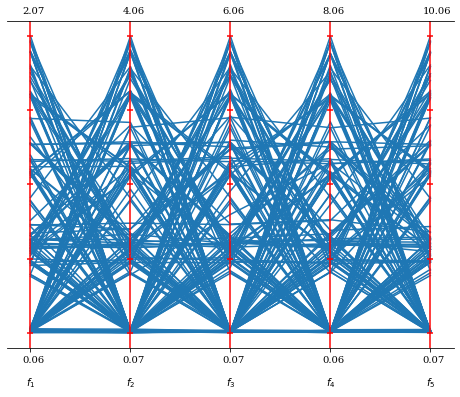

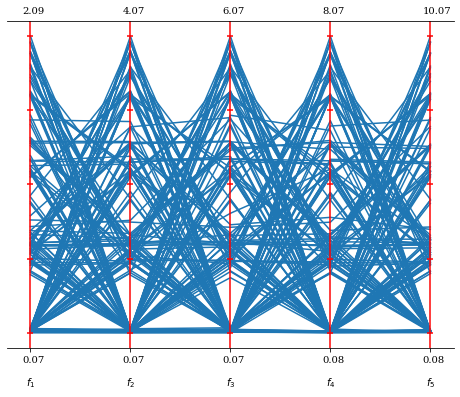

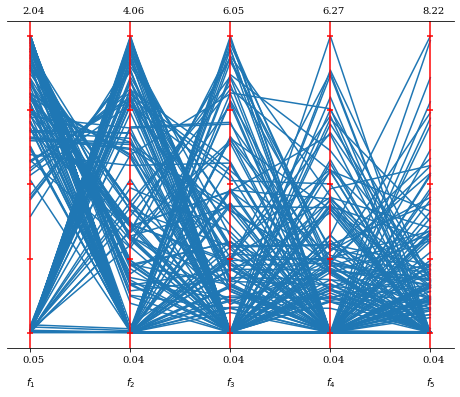

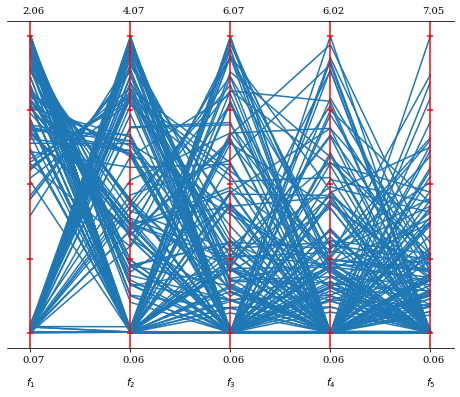

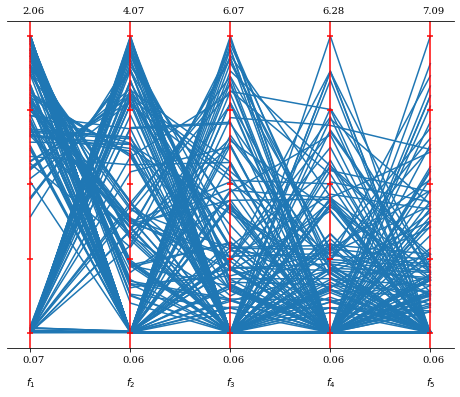

...

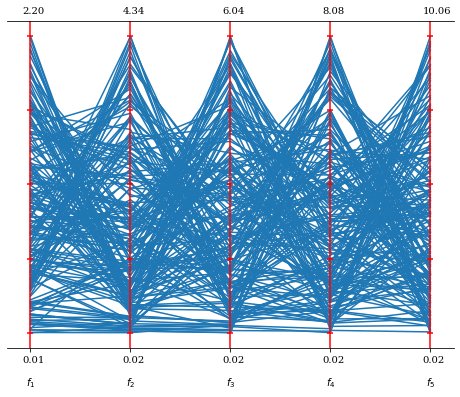

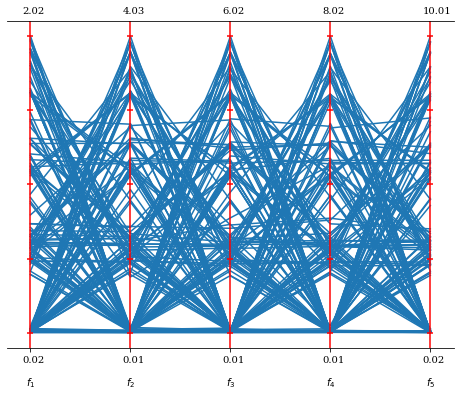

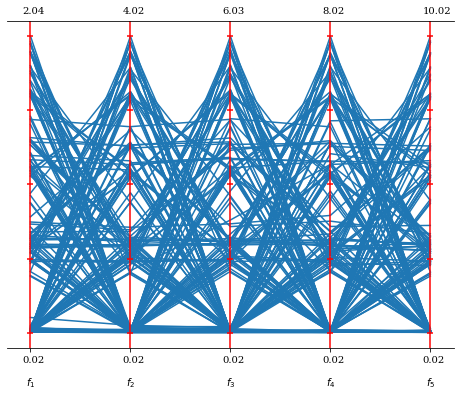

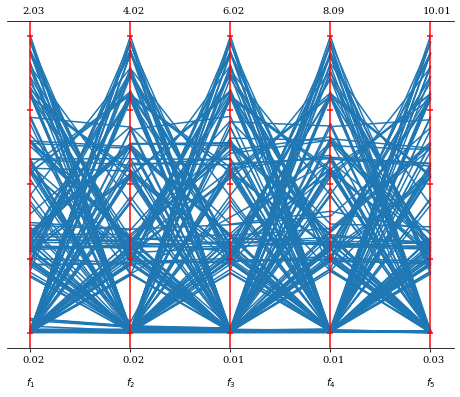

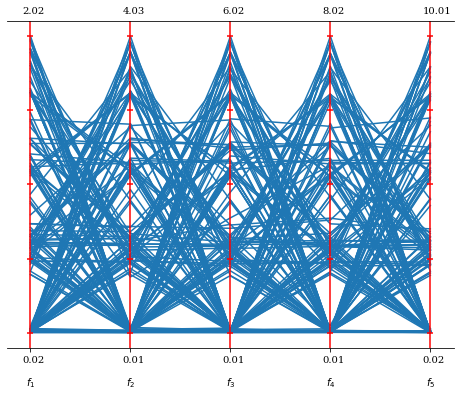

In [35]:
for indice,fila in medianas.iterrows():
    ejecucion=fila['Ejecucion']
    algoritmo=fila['Algoritmo']
    problema=fila['Problema']
    indicador=fila['Indicador']
    conver=finales[(finales['Algoritmo']==algoritmo)&(finales['Problema']==problema)&
                   (finales['Ejecucion']==ejecucion)].iloc[0]
    titulo="img/"+algoritmo+'_'+problema+'_'+indicador+'_'+dim+"_fp.png"
    puntos=conver['F']
    plot = PCP().add(puntos).show()
    plot.show()
    plot.save(titulo)

## Estadística no paramétrica

In [36]:
#iteramos po problema y dentro por indicacion
for problema in problemas:
    for indicador in indicadores:
        resultados=[]
        #por cada algoritmo
        for algoritmo in algoritmos:
            #insertamos elemento a lista de nuestra muestra de 20 por algoritmo
            resultados.append(finales[(finales['Problema']==problema)&(finales['Algoritmo']==algoritmo)][indicador])
        #realizamos el estadítico
        print(problema, indicador)
        print(stats.kruskal(resultados[0],resultados[1],resultados[2]))
        k=3
        #print('Power')
        #effect=(stats.kruskal(resultados[0],resultados[1],resultados[2])[0]-k+1)/(len(resultados[0])+len(resultados[1])+len(resultados[2])-k)
        #analysis = statsmodels.stats.power.TTestPower()
        #print(analysis.power(effect_size=effect,nobs=60,alpha=0.05, alternative='two-sided'))

wfg1 gdp
KruskalResult(statistic=42.17999999999998, pvalue=6.929938439272307e-10)
wfg1 delta_p
KruskalResult(statistic=41.49540983606559, pvalue=9.758571352642111e-10)
wfg1 igdp
KruskalResult(statistic=39.7232786885246, pvalue=2.367007484826241e-09)
wfg1 Tiempo
KruskalResult(statistic=52.459016393442624, pvalue=4.061339800128413e-12)
wfg2 gdp
KruskalResult(statistic=51.81147540983608, pvalue=5.614111905374888e-12)
wfg2 delta_p
KruskalResult(statistic=47.892131147540994, pvalue=3.9843351061081385e-11)
wfg2 igdp
KruskalResult(statistic=36.20491803278688, pvalue=1.374681032107812e-08)
wfg2 Tiempo
KruskalResult(statistic=39.39147540983603, pvalue=2.7941505201693017e-09)
wfg3 gdp
KruskalResult(statistic=44.87737704918035, pvalue=1.7988766834637114e-10)
wfg3 delta_p
KruskalResult(statistic=44.38557377049182, pvalue=2.3003563476490106e-10)
wfg3 igdp
KruskalResult(statistic=51.30524590163935, pvalue=7.2311505937671205e-12)
wfg3 Tiempo
KruskalResult(statistic=52.459016393442624, pvalue=4.061339

In [37]:
posthocs=[]
for problema in problemas:
    temp=finales[finales['Problema']==problema]
    for indicador in indicadores:
        posthoc=sp.posthoc_dunn(a=temp,val_col=indicador,group_col='Algoritmo',p_adjust='holm').copy()
        
        posthoc['Indicador']=indicador
        posthoc['Problema']=problema
        posthocs.append(posthoc)
posthocs=pd.concat(posthocs)
posthocs

,MOEAD,NSGA2,NSGA3,Indicador,Problema
MOEAD,1.000000e+00,1.054803e-09,9.218846e-02,gdp,wfg1
NSGA2,1.054803e-09,1.000000e+00,8.858029e-06,gdp,wfg1
NSGA3,9.218846e-02,8.858029e-06,1.000000e+00,gdp,wfg1
MOEAD,1.000000e+00,5.233758e-06,1.424634e-01,delta_p,wfg1
NSGA2,5.233758e-06,1.000000e+00,2.108032e-09,delta_p,wfg1
...,...,...,...,...,...
NSGA2,5.273659e-04,1.000000e+00,1.609729e-12,igdp,wfg6
NSGA3,5.273659e-04,1.609729e-12,1.000000e+00,igdp,wfg6
MOEAD,1.000000e+00,1.317964e-12,5.859585e-04,Tiempo,wfg6
NSGA2,1.317964e-12,1.000000e+00,5.859585e-04,Tiempo,wfg6


In [38]:
rankings=[]
#volvemos booleanos los resultados de post hoc
posthocs[algoritmos]=posthocs[algoritmos]>0.05
#iteramos sobre las filas
for indice,combinacion in posthocs.iterrows():
    #guardamos el índice, indicador, problema y media de la fila
    algoritmo_actual=indice
    indicador=combinacion['Indicador']
    problema=combinacion['Problema']
    media_actual=promedios[(promedios['Problema']==problema)&
                           (promedios['Algoritmo']==algoritmo_actual)][indicador].iloc[0]
    #iteramos sobre los algoritmos con los que compararemos
    for algoritmo_comparar in algoritmos:
        #si no rechazamos hipótesis nula:
        if combinacion[algoritmo_comparar]:
            combinacion[algoritmo_comparar]=0
        #si la rechazamos
        else:
            media_comparar=promedios[(promedios['Problema']==problema)&
                                     (promedios['Algoritmo']==algoritmo_comparar)][indicador].iloc[0]
            if media_actual<media_comparar:
                combinacion[algoritmo_comparar]=1
            else:
                combinacion[algoritmo_comparar]=-1
            if indicador=='hv':
                combinacion[algoritmo_comparar]*=-1
    rankings.append(combinacion)
#hay un error en la parte de hv
comparaciones=pd.DataFrame(rankings).set_index(['Indicador','Problema'], append=True)
comparaciones

MOEAD  NSGA2  NSGA3
      Indicador Problema                     
MOEAD gdp       wfg1          0      1      0
NSGA2 gdp       wfg1         -1      0     -1
NSGA3 gdp       wfg1          0      1      0
MOEAD delta_p   wfg1          0      1      0
NSGA2 delta_p   wfg1         -1      0     -1
...                         ...    ...    ...
      igdp      wfg6         -1      0     -1
NSGA3 igdp      wfg6          1      1      0
MOEAD Tiempo    wfg6          0     -1     -1
NSGA2 Tiempo    wfg6          1      0      1
NSGA3 Tiempo    wfg6          1     -1      0

[72 rows x 3 columns]

In [39]:
suma=pd.DataFrame(comparaciones.sum(axis=1))
suma.columns=['sumas']
suma

sumas
      Indicador Problema       
MOEAD gdp       wfg1          1
NSGA2 gdp       wfg1         -2
NSGA3 gdp       wfg1          1
MOEAD delta_p   wfg1          1
NSGA2 delta_p   wfg1         -2
...                         ...
      igdp      wfg6         -2
NSGA3 igdp      wfg6          2
MOEAD Tiempo    wfg6         -2
NSGA2 Tiempo    wfg6          2
NSGA3 Tiempo    wfg6          0

[72 rows x 1 columns]

In [40]:
posiciones=suma.unstack(level=1).unstack(level=1)
posiciones=(posiciones*-1).rank().applymap(int)
posiciones# esta está bien

sumas                                                  ...       \
Indicador Tiempo                          delta_p                 ...  gdp   
Problema    wfg1 wfg2 wfg3 wfg4 wfg5 wfg6    wfg1 wfg2 wfg3 wfg4  ... wfg3   
MOEAD          3    3    3    3    3    3       1    3    3    3  ...    3   
NSGA2          2    1    2    1    1    1       3    2    2    2  ...    2   
NSGA3          1    1    1    2    2    2       1    1    1    1  ...    1   

                                                        
Indicador                igdp                           
Problema  wfg4 wfg5 wfg6 wfg1 wfg2 wfg3 wfg4 wfg5 wfg6  
MOEAD        1    1    1    1    2    3    2    2    2  
NSGA2        3    3    3    3    2    1    3    3    3  
NSGA3        2    2    2    1    1    2    1    1    1  

[3 rows x 24 columns]

In [41]:
#puntos=suma.unstack(level=1).unstack(level=1)
#puntos=puntos.rank().applymap(int)
puntos=(posiciones*-1)+len(algoritmos)+1
puntos#n+1-posicion

sumas                                                  ...       \
Indicador Tiempo                          delta_p                 ...  gdp   
Problema    wfg1 wfg2 wfg3 wfg4 wfg5 wfg6    wfg1 wfg2 wfg3 wfg4  ... wfg3   
MOEAD          1    1    1    1    1    1       3    1    1    1  ...    1   
NSGA2          2    3    2    3    3    3       1    2    2    2  ...    2   
NSGA3          3    3    3    2    2    2       3    3    3    3  ...    3   

                                                        
Indicador                igdp                           
Problema  wfg4 wfg5 wfg6 wfg1 wfg2 wfg3 wfg4 wfg5 wfg6  
MOEAD        3    3    3    3    2    1    2    2    2  
NSGA2        1    1    1    1    2    3    1    1    1  
NSGA3        2    2    2    3    3    2    3    3    3  

[3 rows x 24 columns]

### Conteo por mayoría

In [42]:
posiciones.apply(pd.value_counts,axis=1).fillna(0).applymap(int)[1]#conteo por mayoría es la primera columna

MOEAD     6
NSGA2     5
NSGA3    17
Name: 1, dtype: int64

### Conteo de borda

In [43]:
puntos.apply(sum,axis=1)
#¿hay alguna forma de hacer que ganen los otros algoritmos?

MOEAD    41
NSGA2    43
NSGA3    65
dtype: int64

### Condorcet

In [44]:
condorcet=comparaciones==1
condorcet.head()

,,,MOEAD,NSGA2,NSGA3
,Indicador,Problema,,,
MOEAD,gdp,wfg1,False,True,False
NSGA2,gdp,wfg1,False,False,False
NSGA3,gdp,wfg1,False,True,False
MOEAD,delta_p,wfg1,False,True,False
NSGA2,delta_p,wfg1,False,False,False


In [45]:
condorcet=condorcet.groupby(level=0).sum()#ves los cruces, si gana en todos gana se vuelve ganador y gana smsemoa en este caso
condorcet

,MOEAD,NSGA2,NSGA3
MOEAD,0,10,3
NSGA2,13,0,4
NSGA3,18,19,0


In [46]:
ganador_condorcet=0
for columna in condorcet.columns:
    #cuantas veces le ganó el otro algoritmo
    perdidas=condorcet[columna]
    #cuantas veces ganó el algoritmo actual
    ganadas=condorcet.loc[columna]
    #si todas las diferencias son positivas tenemos al ganador
    if (ganadas-perdidas>0).sum()==len(algoritmos)-1:
        print(f'Ganador {columna}')
        ganador_condorcet=1
if ganador_condorcet==0:
    print('No hay ganador')
        

Ganador NSGA3


In [47]:
#empate y derrota valen 0, y les sumo un punto a todos para que empieze de 1
#formatos de imagen pdf